# Практикум: Шумоподавление в цифровых изображениях

**Дисциплина:** Основы компьютерного зрения  
**Тема:** Методы шумоподавления и оценка качества изображений

В этом практикуме вы изучите:
- Основные типы шума в изображениях
- Пространственные методы фильтрации
- Современные алгоритмы шумоподавления
- Метрики оценки качества (PSNR, SSIM)
- Практическую реализацию на Python

## Установка библиотек и настройка окружения

In [27]:
# Установка необходимых библиотек в случае выполнения на локальном ПК
# !pip install opencv-python matplotlib scikit-image pywavelets

# Импорт основных библиотек
import cv2
import numpy as np
import matplotlib.pyplot as plt
# кроссплатформенная библиотека для обработки изображений на языке Python
from skimage import data, img_as_float, metrics
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means, estimate_sigma
from skimage.util import random_noise
import pywt # библиотека для волновых преобразований на языке Python
#предназначенная для научных и инженерных расчётов -  расширение базовой библиотеки обработки массивов NumPy
from scipy import ndimage
import warnings #позволяет генерировать предупреждения и управлять их отображением
warnings.filterwarnings('ignore')

# Настройка matplotlib
plt.rcParams['font.size'] = 12
plt.rcParams['figure.figsize'] = (12, 8)
%matplotlib inline

## Вспомогательные функции

In [28]:
def add_noise(image, noise_type='gaussian', **kwargs):
    """
    Добавление различных типов шума к изображению

    Parameters:
    image: исходное изображение
    noise_type: тип шума ('gaussian', 'salt_pepper', 'speckle')
    """
    if noise_type == 'gaussian': # Обработка гауссовского шума
        var = kwargs.get('var', 0.01) #берет параметр дисперсии или использует 0.01 по умолчанию
        return random_noise(image, mode='gaussian', var=var) # функция из skimage для добавления шума
    elif noise_type == 'salt_pepper': #Шум "соль-перец"
        amount = kwargs.get('amount', 0.05) #5% пикселей будут зашумлены
        return random_noise(image, mode='s&p', amount=amount) #
    elif noise_type == 'speckle': #Спекл-шум (мультипликативный шум)
        var = kwargs.get('var', 0.1)
        return random_noise(image, mode='speckle', var=var)

def calculate_metrics(original, denoised):
    """Вычисление PSNR и SSIM метрик
    PSNR (Peak Signal-to-Noise Ratio) - это пиковое отношение сигнал-шум между двумя изображениями - Чем выше значение, тем лучше качество
    SSIM (Structural Similarity) - индекс структурного сходства для изображений -
      SSIM варьируется от -1 до 1, где 1 означает полное совпадение изображений -
        data_range=1.0 - диапазон данных (для нормализованных изображений 0-1)
    """
    psnr = metrics.peak_signal_noise_ratio(original, denoised)
    ssim = metrics.structural_similarity(original, denoised, data_range=1.0)
    return psnr, ssim

def calculate_metrics_rgb(original, denoised):
    """Вычисление PSNR и SSIM для цветных изображений"""
    #data_range=original.max() - original.min() - Автоматическое определение диапазона данных
    psnr = metrics.peak_signal_noise_ratio(original, denoised, data_range=original.max() - original.min())
    #channel_axis=-1 - Указывает, что цветовые каналы находятся по последней оси (RGB)
    ssim = metrics.structural_similarity(original, denoised, data_range=original.max() - original.min(), channel_axis=-1)
    return psnr, ssim

def display_results(original, noisy, denoised, titles, figsize=(15, 5)):
    """Отображение исходного, зашумленного и обработанного изображений"""
    fig, axes = plt.subplots(1, 3, figsize=figsize)

    images = [original, noisy, denoised]
    for i, (img, title, ax) in enumerate(zip(images, titles, axes)):
        ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None) #серый для ч/б, цвет для RGB
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.axis('off') #убирает оси координат

        # Добавление метрик для обработанного изображения
        if i == 2:
            psnr, ssim = calculate_metrics(original, denoised)
            #transform=ax.transAxes - координаты относительно осей (0-1)
            #verticalalignment='top' - выравнивание по верху
            #bbox - белый полупрозрачный фон для текста
            ax.text(0.02, 0.98, f'PSNR: {psnr:.2f} дБ\nSSIM: {ssim:.3f}',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()

## 1. Медианный фильтр
Медианный фильтр идеально подходит для устранения импульсного шума ("соль и перец"), так как заменяет значение пикселя медианой в его окрестности.

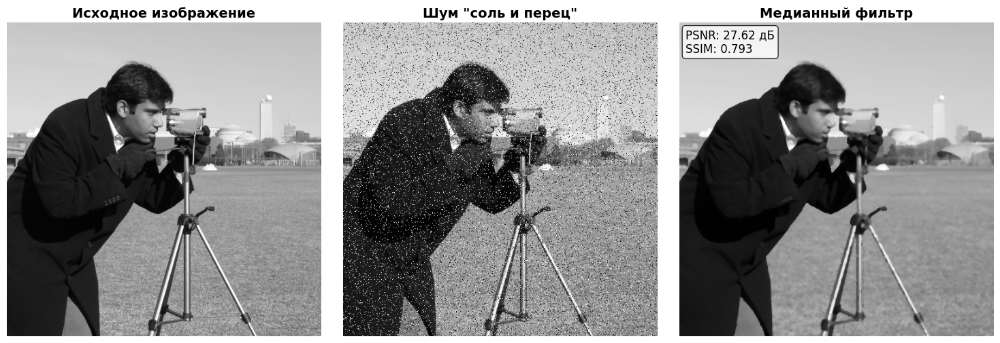

Медианный фильтр эффективно устраняет импульсный шум, сохраняя четкие границы объектов.


In [29]:
# Загрузка тестового изображения
image = img_as_float(data.camera())

# Добавление импульсного шума
noisy_image = add_noise(image, 'salt_pepper', amount=0.1)

# Применение медианного фильтра
median_filtered = cv2.medianBlur((noisy_image * 255).astype(np.uint8), 5) / 255.0

# Отображение результатов
display_results(image, noisy_image, median_filtered,
               ['Исходное изображение', 'Шум "соль и перец"', 'Медианный фильтр'])

print("Медианный фильтр эффективно устраняет импульсный шум, сохраняя четкие границы объектов.")

## 2. Гауссов фильтр
Гауссов фильтр применяет взвешенное усреднение с весами по гауссовому распределению.

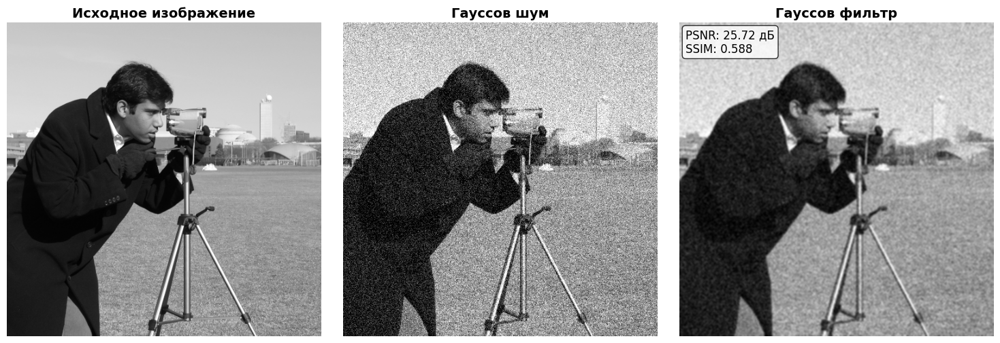

Гауссов фильтр эффективен против гауссова шума, но может размывать края.


In [30]:
# Добавление гауссова шума
noisy_gaussian = add_noise(image, 'gaussian', var=0.02)

# Применение гауссова фильтра
gaussian_filtered = cv2.GaussianBlur(noisy_gaussian, (5, 5), 1.5)

# Отображение результатов
display_results(image, noisy_gaussian, gaussian_filtered,
               ['Исходное изображение', 'Гауссов шум', 'Гауссов фильтр'])

print("Гауссов фильтр эффективен против гауссова шума, но может размывать края.")

## 3. Билатеральный фильтр
Билатеральный фильтр сохраняет края, учитывая как пространственную близость, так и радиометрическое сходство пикселей.

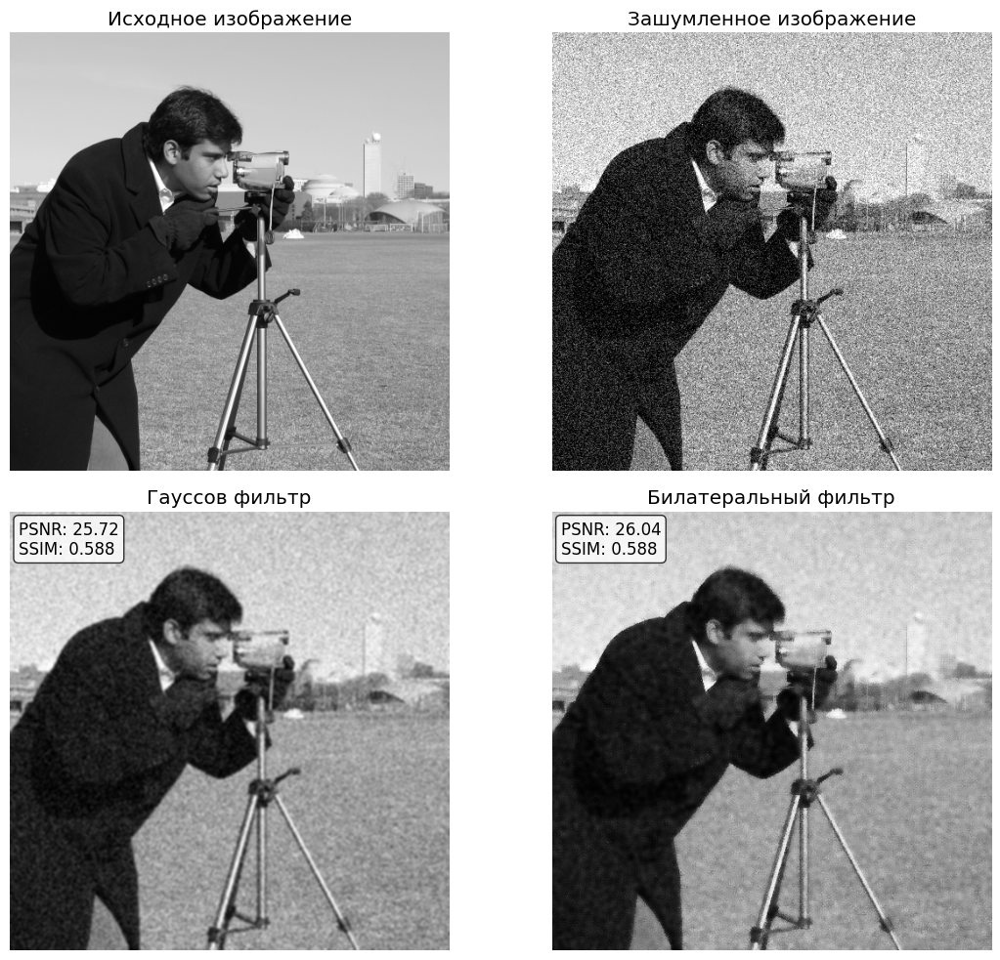

Билатеральный фильтр лучше сохраняет края по сравнению с гауссовым фильтром
Улучшение PSNR: 0.32 дБ


In [31]:
# Применение билатерального фильтра
bilateral_filtered = cv2.bilateralFilter((noisy_gaussian * 255).astype(np.uint8),
                                       d=9, sigmaColor=75, sigmaSpace=75) / 255.0

# Сравнение с гауссовым фильтром
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0,0].imshow(image, cmap='gray')
axes[0,0].set_title('Исходное изображение')
axes[0,0].axis('off')

axes[0,1].imshow(noisy_gaussian, cmap='gray')
axes[0,1].set_title('Зашумленное изображение')
axes[0,1].axis('off')

axes[1,0].imshow(gaussian_filtered, cmap='gray')
axes[1,0].set_title('Гауссов фильтр')
axes[1,0].axis('off')
psnr_g, ssim_g = calculate_metrics(image, gaussian_filtered)
axes[1,0].text(0.02, 0.98, f'PSNR: {psnr_g:.2f}\nSSIM: {ssim_g:.3f}',
               transform=axes[1,0].transAxes, verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

axes[1,1].imshow(bilateral_filtered, cmap='gray')
axes[1,1].set_title('Билатеральный фильтр')
axes[1,1].axis('off')
psnr_b, ssim_b = calculate_metrics(image, bilateral_filtered)
axes[1,1].text(0.02, 0.98, f'PSNR: {psnr_b:.2f}\nSSIM: {ssim_b:.3f}',
               transform=axes[1,1].transAxes, verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Билатеральный фильтр лучше сохраняет края по сравнению с гауссовым фильтром")
print(f"Улучшение PSNR: {psnr_b - psnr_g:.2f} дБ")

## 4. Non-Local Means
Алгоритм Non-Local Means заменяет значение пикселя средним значением всех похожих пикселей изображения.

Оценка стандартного отклонения шума: 0.1285


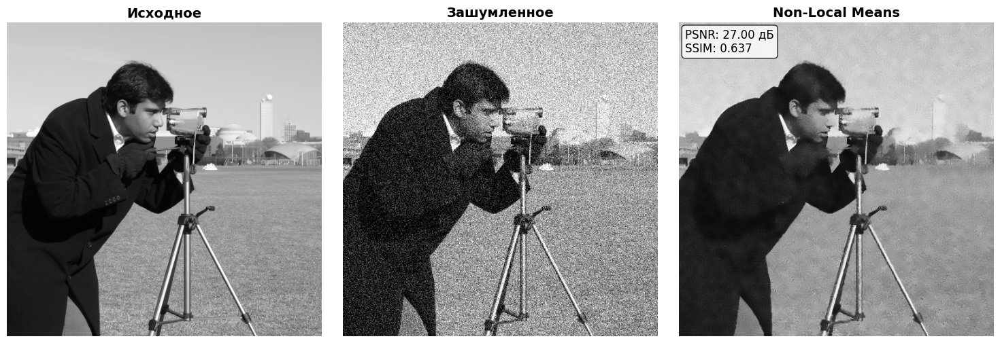

Non-Local Means эффективно восстанавливает текстуры и мелкие детали.


In [32]:
"""
Дополнительно своё объяснение:
Это алгоритм, который основан на идее, что в изображении есть много похожих участков (патчей), даже если они находятся далеко друг от друга.
Представьте, что у вас есть несколько фотографий одного человека.
Даже если на некоторых фотографиях есть дефекты, усреднив информацию со всех фото, можно получить качественное изображение.
"""

# Применение Non-Local Means фильтра
sigma_est = estimate_sigma(noisy_gaussian, channel_axis=None)
print(f'Оценка стандартного отклонения шума: {sigma_est:.4f}')

# NLM с оптимальными параметрами
nlm_result = denoise_nl_means(noisy_gaussian, h=0.8 * sigma_est, fast_mode=True,
                           patch_size=5, patch_distance=6)

# Отображение результатов
display_results(image, noisy_gaussian, nlm_result,
               ['Исходное', 'Зашумленное', 'Non-Local Means'])

print("Non-Local Means эффективно восстанавливает текстуры и мелкие детали.")

## 5. Вейвлет-преобразование для шумоподавления
Вейвлет-шумоподавление работает в частотной области, применяя пороговую обработку к коэффициентам.

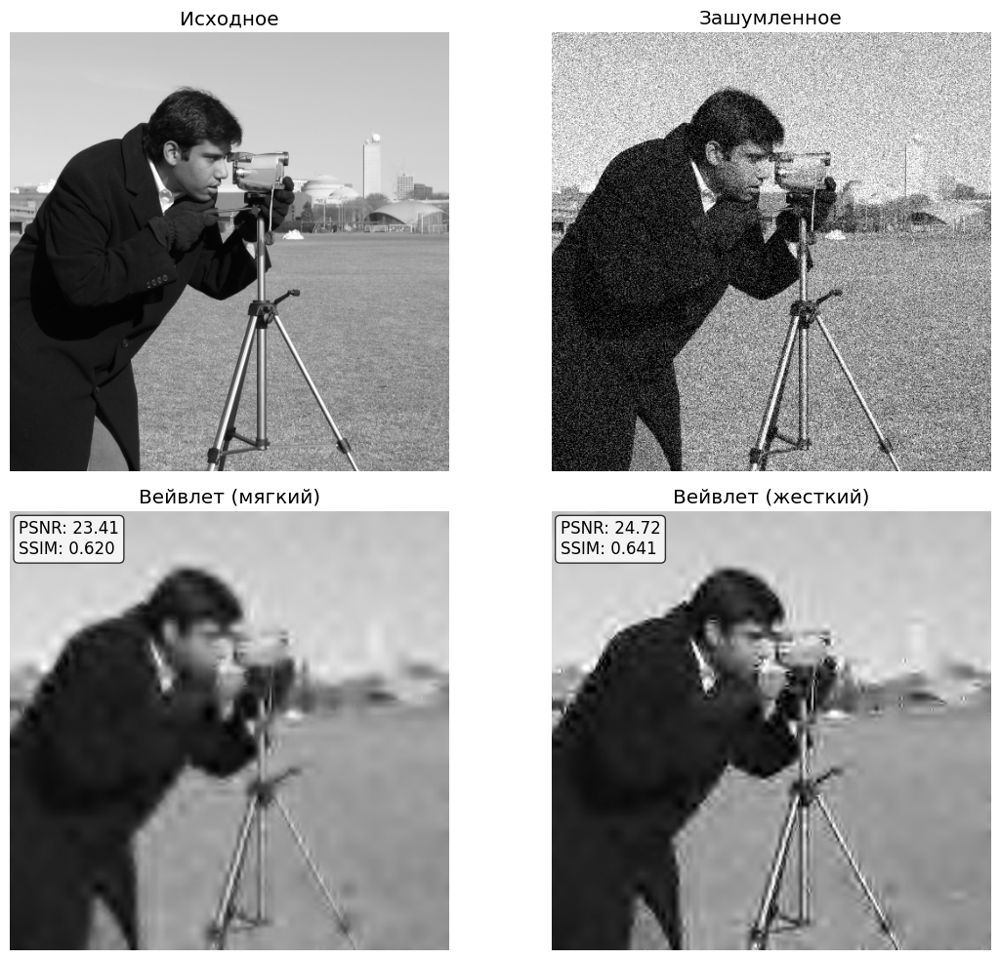

Мягкая пороговая обработка дает более гладкие результаты.
Жесткая пороговая обработка лучше сохраняет резкие переходы.


In [33]:
def wavelet_denoise(image, wavelet='db4', sigma=None, mode='soft'):
    """
    Шумоподавление с использованием вейвлет-преобразования
    """
    # Вейвлет-декомпозиция
    coeffs = pywt.wavedec2(image, wavelet, level=4)

    # Оценка шума по детализирующим коэффициентам
    if sigma is None:
        sigma = np.median(np.abs(coeffs[-1])) / 0.6745

    # Вычисление порога
    threshold = sigma * np.sqrt(2 * np.log(image.size))

    # Пороговая обработка коэффициентов
    coeffs_thresh = list(coeffs)
    coeffs_thresh[0] = coeffs[0]  # Сохраняем аппроксимирующие коэффициенты

    for i in range(1, len(coeffs)):
        coeffs_thresh[i] = tuple([pywt.threshold(detail_coeffs, threshold, mode)
                                 for detail_coeffs in coeffs[i]])

    # Восстановление изображения
    image_denoised = pywt.waverec2(coeffs_thresh, wavelet)

    return np.clip(image_denoised, 0, 1)

# Применение вейвлет-шумоподавления
wavelet_soft = wavelet_denoise(noisy_gaussian, mode='soft')
wavelet_hard = wavelet_denoise(noisy_gaussian, mode='hard')

# Сравнение мягкой и жесткой пороговой обработки
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

images = [image, noisy_gaussian, wavelet_soft, wavelet_hard]
titles = ['Исходное', 'Зашумленное', 'Вейвлет (мягкий)', 'Вейвлет (жесткий)']

for i, (img, title) in enumerate(zip(images, titles)):
    row, col = i // 2, i % 2
    axes[row, col].imshow(img, cmap='gray')
    axes[row, col].set_title(title)
    axes[row, col].axis('off')

    if i > 1:  # Добавляем метрики для обработанных изображений
        psnr, ssim = calculate_metrics(image, img)
        axes[row, col].text(0.02, 0.98, f'PSNR: {psnr:.2f}\nSSIM: {ssim:.3f}',
                           transform=axes[row, col].transAxes, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

print("Мягкая пороговая обработка дает более гладкие результаты.")
print("Жесткая пороговая обработка лучше сохраняет резкие переходы.")

## 6. Total Variation (TV) Denoising
Метод Total Variation минимизирует общую вариацию изображения, эффективно удаляя шум при сохранении границ.

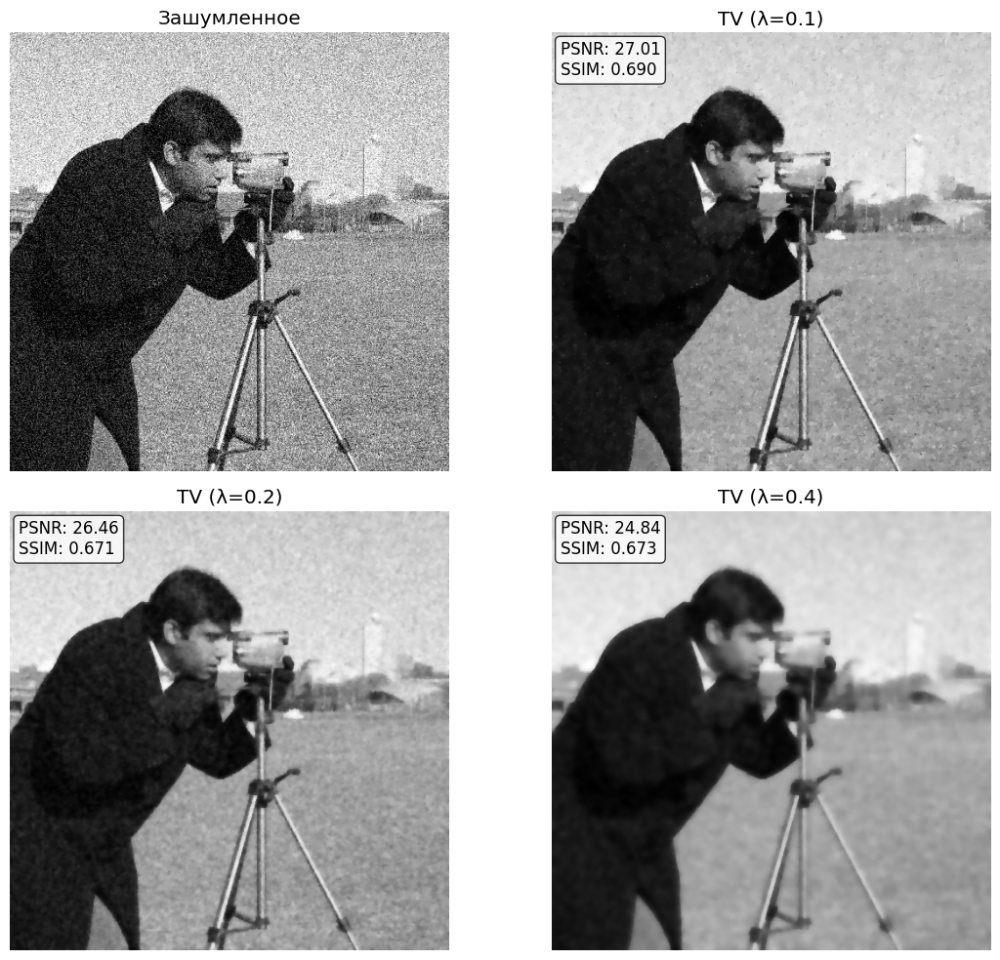

Параметр регуляризации λ контролирует баланс между шумоподавлением и сохранением деталей.
Большие значения λ приводят к более сильному сглаживанию.


In [34]:
# Применение TV denoising с различными параметрами регуляризации
tv_light = denoise_tv_chambolle(noisy_gaussian, weight=0.1)
tv_moderate = denoise_tv_chambolle(noisy_gaussian, weight=0.2)
tv_strong = denoise_tv_chambolle(noisy_gaussian, weight=0.4)

# Отображение результатов
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

images = [noisy_gaussian, tv_light, tv_moderate, tv_strong]
titles = ['Зашумленное', 'TV (λ=0.1)', 'TV (λ=0.2)', 'TV (λ=0.4)']

for i, (img, title) in enumerate(zip(images, titles)):
    row, col = i // 2, i % 2
    axes[row, col].imshow(img, cmap='gray')
    axes[row, col].set_title(title)
    axes[row, col].axis('off')

    if i > 0:  # Добавляем метрики для обработанных изображений
        psnr, ssim = calculate_metrics(image, img)
        axes[row, col].text(0.02, 0.98, f'PSNR: {psnr:.2f}\nSSIM: {ssim:.3f}',
                           transform=axes[row, col].transAxes, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

print("Параметр регуляризации λ контролирует баланс между шумоподавлением и сохранением деталей.")
print("Большие значения λ приводят к более сильному сглаживанию.")

## 7. Сравнительный анализ методов
Проведем комплексное сравнение всех изученных методов.

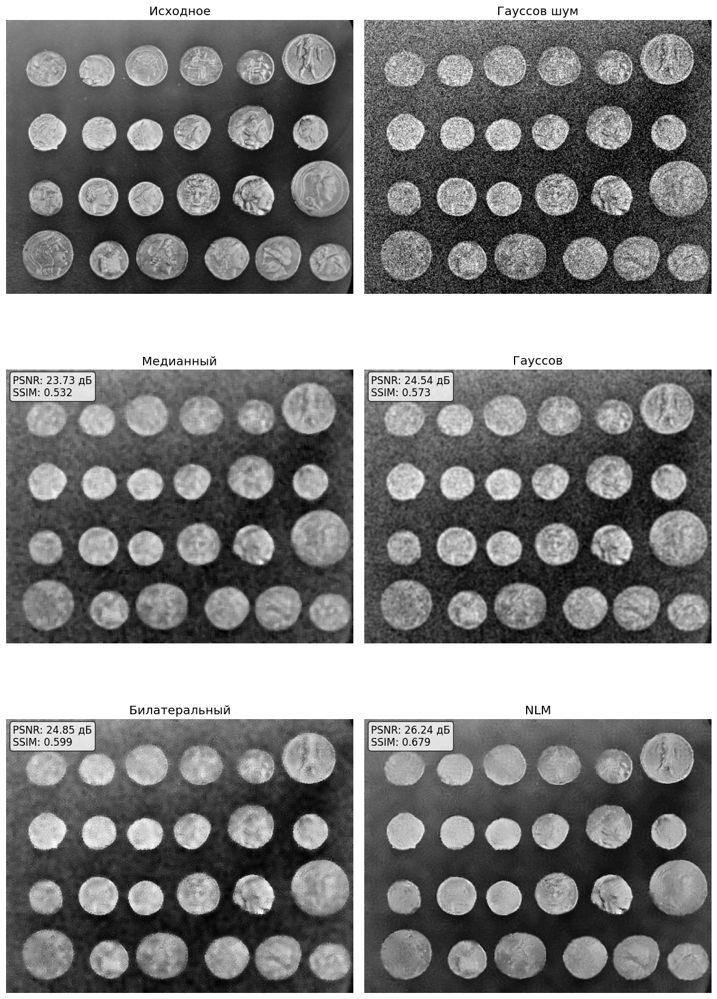

ValueError: Input images must have the same dimensions.

In [35]:
# 7. Сравнительный анализ методов
test_image = img_as_float(data.coins())
gaussian_noise = add_noise(test_image, 'gaussian', var=0.02)

methods_results = {
    'Медианный': cv2.medianBlur((gaussian_noise*255).astype(np.uint8), 5)/255.0,
    'Гауссов': cv2.GaussianBlur(gaussian_noise, (5,5), 1.0),
    'Билатеральный': cv2.bilateralFilter((gaussian_noise*255).astype(np.uint8), 9,75,75)/255.0,
    'NLM': denoise_nl_means(gaussian_noise, h=0.8*estimate_sigma(gaussian_noise, channel_axis=None),
                           fast_mode=True, patch_size=5, patch_distance=6),
    'Вейвлет': wavelet_denoise(gaussian_noise, mode='soft'),
    'TV': denoise_tv_chambolle(gaussian_noise, weight=0.15)
}

# Графическое сравнение
fig, axes = plt.subplots(3, 2, figsize=(12, 18))
axes = axes.ravel()
titles = ['Исходное', 'Гауссов шум'] + list(methods_results.keys())
images = [test_image, gaussian_noise] + list(methods_results.values())

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
    if title not in ['Исходное', 'Гауссов шум']:
        psnr, ssim = calculate_metrics(test_image, img)
        ax.text(0.02, 0.98, f'PSNR: {psnr:.2f} дБ\nSSIM: {ssim:.3f}',
                transform=ax.transAxes, va='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
plt.tight_layout()
plt.show()

# Табличный вывод метрик
metrics_table = []
for name, denoised in methods_results.items():
    psnr, ssim = calculate_metrics(test_image, denoised)
    metrics_table.append((name, psnr, ssim))

print(f"{'Метод':<12} {'PSNR(дБ)':>10} {'SSIM':>8}")
print('-'*34)
for name, psnr, ssim in sorted(metrics_table, key=lambda x: x[1], reverse=True):
    print(f"{name:<12} {psnr:>10.2f} {ssim:>8.3f}")

## 8. Работа с цветными изображениями
Демонстрация FastNLMeans для цветных изображений.

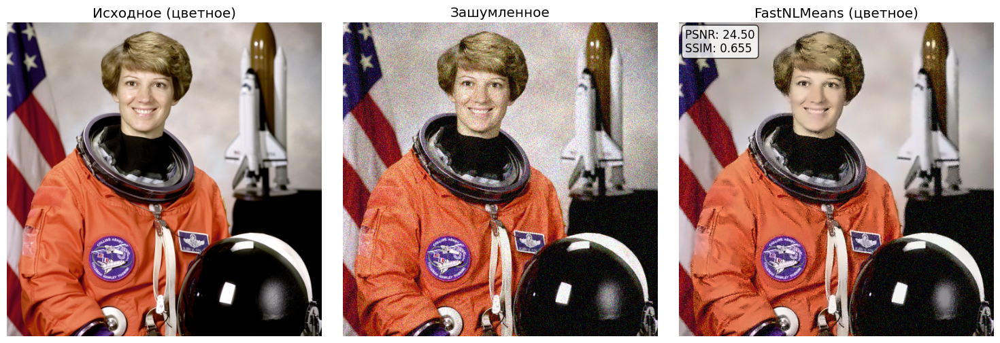

FastNLMeans от OpenCV обеспечивает быструю и эффективную реализацию для цветных изображений.


In [ ]:
# Загрузка цветного изображения
color_image = img_as_float(data.astronaut())
color_noisy = add_noise(color_image, 'gaussian', var=0.01)

"""
Дополнительно от меня:
Обычные фильтры vs NLMeans:
Метод	            Принцип работы
Гауссов/Медианный	Смотрит только на соседние пиксели
NLMeans	            Ищет похожие участки по всему изображению
"""
# Применение FastNLMeans для цветных изображений - от алгоритма Non-Local Means
color_denoised = cv2.fastNlMeansDenoisingColored(
    (color_noisy * 255).astype(np.uint8),
    None, 10, 10, 7, 21
) / 255.0

# Отображение результатов
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(color_image)
axes[0].set_title('Исходное (цветное)')
axes[0].axis('off')

axes[1].imshow(color_noisy)
axes[1].set_title('Зашумленное')
axes[1].axis('off')

axes[2].imshow(color_denoised)
axes[2].set_title('FastNLMeans (цветное)')
axes[2].axis('off')

# Добавление метрик
psnr_color, ssim_color = calculate_metrics_rgb(color_image, color_denoised)
axes[2].text(0.02, 0.98, f'PSNR: {psnr_color:.2f}\nSSIM: {ssim_color:.3f}',
               transform=axes[2].transAxes, verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

print("FastNLMeans от OpenCV обеспечивает быструю и эффективную реализацию для цветных изображений.")

## 9. Задания для самостоятельной работы

### Задание 1: Анализ параметров билатерального фильтра
1. Загрузите собственное изображение или используйте из `skimage.data`
2. Добавьте гауссов шум с σ = 0.05
3. Примените билатеральный фильтр с разными параметрами:
   - d = [5, 9, 15]
   - σ_color = [50, 75, 100]
   - σ_space = [50, 75, 100]
4. Постройте графики зависимости PSNR и SSIM от параметров
5. Определите оптимальные параметры

### Задание 2: Сравнение методов на разных типах шума
1. Создайте синтетическое изображение с геометрическими фигурами
2. Добавьте смешанный шум (гауссов + импульсный)
3. Примените все изученные методы
4. Создайте таблицу сравнения по метрикам
5. Проанализируйте визуальное качество результатов

### Задание 3: Разработка гибридного метода
1. Разработайте собственный гибридный алгоритм
2. Комбинируйте 2-3 различных метода
3. Реализуйте автоматический выбор параметров
4. Протестируйте на различных типах изображений
5. Сравните с стандартными методами

d=5, σ_color=50, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=50, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=50, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=75, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=75, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=75, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=100, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=100, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=5, σ_color=100, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=50, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=50, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=50, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=75, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=75, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=75, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=100, σ_space=50 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=100, σ_space=75 -> PSNR=4.83, SSIM=0.007
d=9, σ_color=100, σ_space=100 -> PSNR=4.83, SSIM=0.007
d=15, σ_color=50, σ_space=50 -> PS

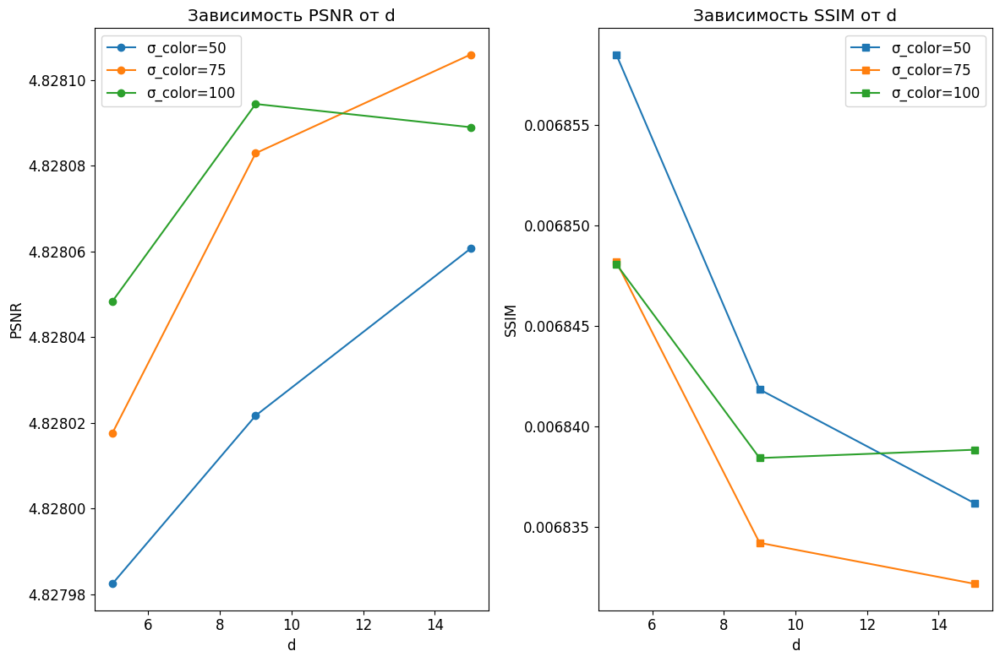


🔹 Оптимальные параметры:
d = 15, σ_color = 75, σ_space = 100
PSNR = 4.83, SSIM = 0.007


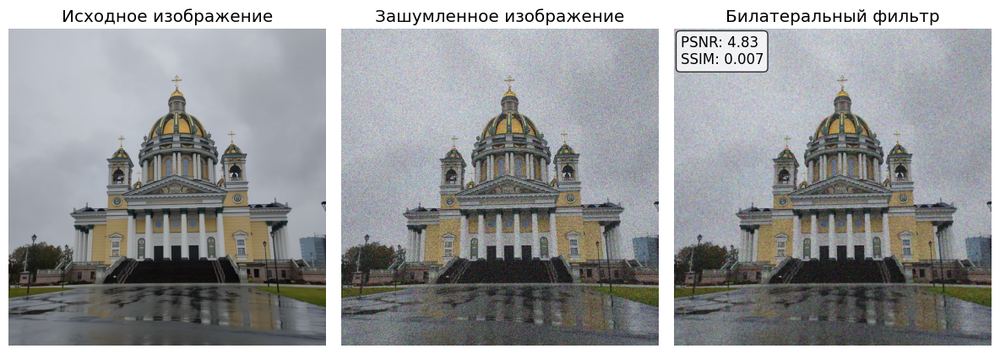

In [ ]:
# Задание 1 - Анализ параметров билатериального фильтра
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread("D:\Programming-at-SUSU\BasicOfCV\materials\photo7.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Добавление гауссова шума
noisy_gaussian = add_noise(image, 'gaussian', var=0.05)

# Для 3 пункта - настройки параметров
d_values = [5, 9, 15]
sigma_color_values = [50, 75, 100]
sigma_space_values = [50, 75, 100]

results = []
# Применение параметров 
for d in d_values:
    for sc in sigma_color_values:
        for ss in sigma_space_values:
            filtered = cv2.bilateralFilter((noisy_gaussian * 255).astype(np.uint8), d=d, sigmaColor=sc, sigmaSpace=ss) / 255.0
            psnr, ssim = calculate_metrics_rgb(image, filtered)
            results.append((d, sc, ss, psnr, ssim))
            print(f"d={d}, σ_color={sc}, σ_space={ss} -> PSNR={psnr:.2f}, SSIM={ssim:.3f}")

#Переводим в удобный формат
results = np.array(results, dtype=object)

# PSNR vs d
plt.subplot(1, 2, 1)
for sc in sigma_color_values:
    vals = [r[3] for r in results if r[1] == sc and r[2] == 75]  # фиксируем sigma_space=75
    plt.plot(d_values, vals, marker='o', label=f'σ_color={sc}')
plt.xlabel('d')
plt.ylabel('PSNR')
plt.title('Зависимость PSNR от d')
plt.legend()

# SSIM vs d
plt.subplot(1, 2, 2)
for sc in sigma_color_values:
    vals = [r[4] for r in results if r[1] == sc and r[2] == 75]
    plt.plot(d_values, vals, marker='s', label=f'σ_color={sc}')
plt.xlabel('d')
plt.ylabel('SSIM')
plt.title('Зависимость SSIM от d')
plt.legend()

plt.tight_layout()
plt.show()

# ---------- Поиск оптимальных параметров ----------
best = max(results, key=lambda x: (x[3] + x[4]))
print("\n🔹 Оптимальные параметры:")
print(f"d = {best[0]}, σ_color = {best[1]}, σ_space = {best[2]}")
print(f"PSNR = {best[3]:.2f}, SSIM = {best[4]:.3f}")


# -------- Визуализация ---------
bilateral_filtered = cv2.bilateralFilter((noisy_gaussian * 255).astype(np.uint8),
                                       d=9, sigmaColor=75, sigmaSpace=75) / 255.0

fig, axes = plt.subplots(1, 3, figsize=(12, 10))

axes[0].imshow(image)
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

axes[1].imshow(noisy_gaussian, cmap='gray')
axes[1].set_title('Зашумленное изображение')
axes[1].axis('off')

axes[2].imshow(bilateral_filtered, cmap='gray')
axes[2].set_title('Билатеральный фильтр')
axes[2].axis('off')
# calculate_metrics_rgb - метрики для цветных  изображений, а иначе для ч/б изображений
psnr_b, ssim_b = calculate_metrics_rgb(image, bilateral_filtered)
axes[2].text(0.02, 0.98, f'PSNR: {psnr_b:.2f}\nSSIM: {ssim_b:.3f}',
               transform=axes[2].transAxes, verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()



Результаты сравнения методов:
        Метод      PSNR     SSIM
    Медианный 27.998403 0.562728
      Вейвлет 22.604265 0.155272
      Гауссов 22.428024 0.128222
           TV 19.237418 0.106092
Билатеральный 17.559671 0.117516
          NLM 17.295160 0.102906


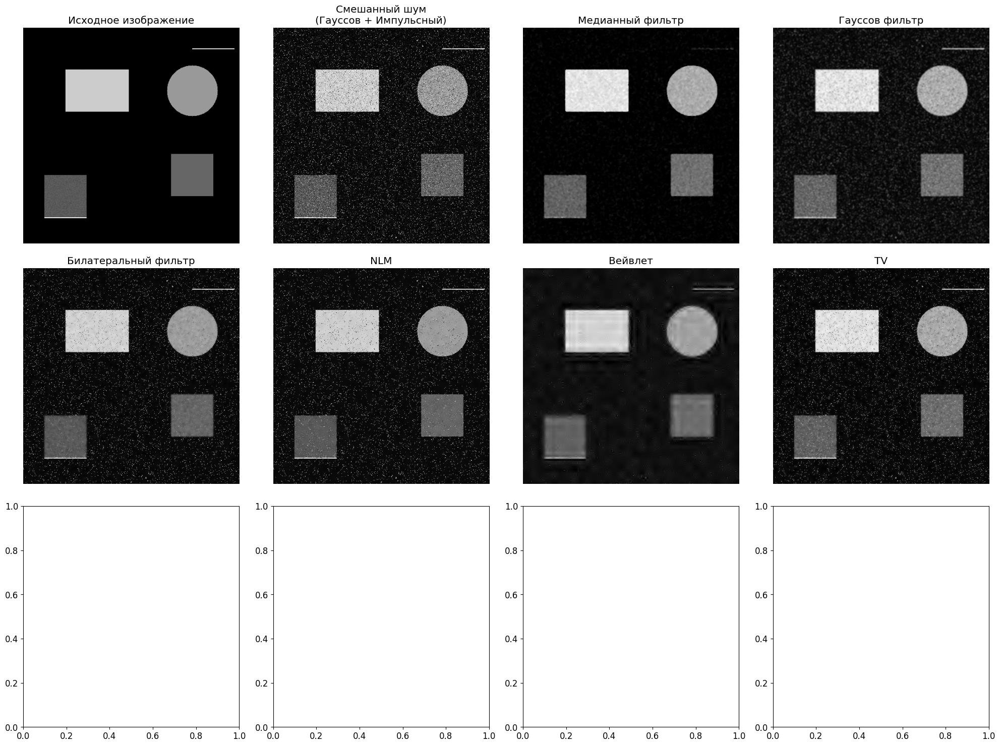

In [ ]:
# Задание 2 - Сравнение методов на разных типах шума
# Метод - создание синтетического изображения с геометрическими фигурами
import pandas as pd

def create_synthetic_image(size=(512, 512)):
    image = np.zeros(size, dtype=np.float32)
    image[100:200, 100:250] = 0.8 # Прямоугольник
    # Круг
    center = (400, 150)
    radius = 60
    y, x = np.ogrid[:size[0], :size[1]]
    mask = (x - center[0])**2 + (y - center[1])**2 <= radius**2
    image[mask] = 0.6
    
    # Треугольник
    for i in range(100):
        image[300:400, 350+i:450-i] = 0.4
    # Линии
    image[50:52, 400:500] = 1.0
    image[450:452, 50:150] = 1.0
    # Текстурная область
    image[350:450, 50:150] = 0.3
    image[350:450, 50:150] += 0.1 * np.random.rand(100, 100)
    return image

#метод - добавление смешанного шума (гауссов + импульсный)
def add_mixed_noise(image, gaussian_var=0.01, salt_pepper_amount=0.05):
    noisy = random_noise(image, mode='gaussian', var=gaussian_var)
    noisy = random_noise(noisy, mode='s&p', amount=salt_pepper_amount)
    return noisy

def wavelet_denoise(image, wavelet='db4', sigma=None, mode='soft'):
    """
    Шумоподавление с использованием вейвлет-преобразования
    """
    # Вейвлет-декомпозиция
    coeffs = pywt.wavedec2(image, wavelet, level=4)

    # Оценка шума по детализирующим коэффициентам
    if sigma is None:
        sigma = np.median(np.abs(coeffs[-1])) / 0.6745

    # Вычисление порога
    threshold = sigma * np.sqrt(2 * np.log(image.size))

    # Пороговая обработка коэффициентов
    coeffs_thresh = list(coeffs)
    coeffs_thresh[0] = coeffs[0]  # Сохраняем аппроксимирующие коэффициенты

    for i in range(1, len(coeffs)):
        coeffs_thresh[i] = tuple([pywt.threshold(detail_coeffs, threshold, mode)
                                 for detail_coeffs in coeffs[i]])

    # Восстановление изображения
    image_denoised = pywt.waverec2(coeffs_thresh, wavelet)

    return np.clip(image_denoised, 0, 1)

# ---- основная часть ----
#1 Пункт
image = create_synthetic_image()
#2 Пункт
noisy_mixed = add_mixed_noise(image, gaussian_var=0.01, salt_pepper_amount=0.05)

#3 Пункт

# 1. Медианный фильтр
median_filtered = cv2.medianBlur((noisy_mixed * 255).astype(np.uint8), 5)
median_filtered = median_filtered.astype(np.float32) / 255.0

# 2. Гауссов фильтр
gaussian_filtered = cv2.GaussianBlur(noisy_mixed, (5, 5), 1.5)

# 3. Билатеральный фильтр
bilateral_filtered = cv2.bilateralFilter((noisy_mixed * 255).astype(np.uint8), 9, 75, 75)
bilateral_filtered = bilateral_filtered.astype(np.float32) / 255.0

# 4. Нелокальное среднее (NLM)
sigma_est = np.mean(estimate_sigma(noisy_mixed))
nlm_filtered = denoise_nl_means(noisy_mixed, h=1.15 * sigma_est, fast_mode=True, patch_size=5, patch_distance=6)

# 5. Вейвлет-преобразование
wavelet_filtered = wavelet_denoise(noisy_mixed)
# Обрезка до исходного размера (вейвлет может изменить размер)
min_shape = min(wavelet_filtered.shape[0], image.shape[0]), min(wavelet_filtered.shape[1], image.shape[1])
wavelet_filtered = wavelet_filtered[:min_shape[0], :min_shape[1]]
image_cropped = image[:min_shape[0], :min_shape[1]]
noisy_cropped = noisy_mixed[:min_shape[0], :min_shape[1]]

# 6. Тотальная вариация (TV)
tv_filtered = denoise_tv_chambolle(noisy_mixed, weight=0.1)

#4 Пункт
methods = {
    'Медианный': median_filtered,
    'Гауссов': gaussian_filtered,
    'Билатеральный': bilateral_filtered,
    'NLM': nlm_filtered,
    'Вейвлет': wavelet_filtered,
    'TV': tv_filtered,
}

results = []
for name, filtered in methods.items():
    if name == 'Вейвлет':
        # Для вейвлета используем обрезанные изображения
        psnr = metrics.peak_signal_noise_ratio(image_cropped, filtered, data_range=1.0)
        ssim = metrics.structural_similarity(image_cropped, filtered, data_range=1.0)
    else:
        psnr = metrics.peak_signal_noise_ratio(image, filtered, data_range=1.0)
        ssim = metrics.structural_similarity(image, filtered, data_range=1.0)
    
    results.append({
        'Метод': name,
        'PSNR': psnr,
        'SSIM': ssim
    })

# Создание таблицы результатов
df_results = pd.DataFrame(results)
df_results = df_results.sort_values('PSNR', ascending=False)
print("\nРезультаты сравнения методов:")
print(df_results.to_string(index=False))

# Визуализация результатов
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

# Исходное и зашумленное изображение
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

axes[1].imshow(noisy_mixed, cmap='gray')
axes[1].set_title('Смешанный шум\n(Гауссов + Импульсный)')
axes[1].axis('off')

# Отображение результатов фильтрации
images_to_show = [
    (median_filtered, 'Медианный фильтр'),
    (gaussian_filtered, 'Гауссов фильтр'),
    (bilateral_filtered, 'Билатеральный фильтр'),
    (nlm_filtered, 'NLM'),
    (wavelet_filtered, 'Вейвлет'),
    (tv_filtered, 'TV')
]

for i, (img, title) in enumerate(images_to_show, 2):
    if i < len(axes):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(title)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

#5 Пункт
"""
ВИЗУАЛЬНЫЙ АНАЛИЗ
- NLM и Вейвлет: лучше сохраняют детали и текстуры"
- Медианный фильтр: эффективен против импульсного шума"
- TV: хорошо сохраняет границы, но может oversmooth текстуры"
- Гауссов фильтр: размывает края, но хорошо справляется с гауссовым шумом"
\- Билатеральный фильтр: сохраняет края лучше чем гауссов"

"""

In [ ]:
# Задание 3 - Разработка гибридного метода

# Ваш код здесь...